# Project 4: Computer Vision

## Advanced Lane Detection with OpenCV

### Objective
On the first project of the Self-Driving Car Nanodegree we developed a rudimentary algorithm to detect lane lines on roads. This algorithm was only able to detect straight lines under constant lighting and road conditions. In addition, the algorithm was not able to extract valuable road information such as road curvature which we would need to steer the vehicle correctlty. A more robust algorithm is necessary to tackle these challenges. The objective of this project was to develop a more robust approach to tackle the following unresolved challenges from project one: 

1. Detecting lanes on roads that can accurately identify road curvature 
2. Detect lanes under varying lighting conditions (shadows, rapid changes of brightness, and pavement color)

### Algorithm Overview
The following are the steps to detect road lane lines robustly:

1. Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
2. Apply a distortion correction to raw images.
3. Use color transforms, gradients, etc., to create a thresholded binary image.
4. Apply a perspective transform to rectify binary image ("bird's-eye view").
5. Detect lane pixels and fit to find the lane boundary.
6. Determine the curvature of the lane and vehicle position with respect to center.
7. Warp the detected lane boundaries back onto the original image.
8. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

### Notebook Summary
This IPython notebook is divided in three major parts.

**Part 1 - Process Image Frames:**
Contains detailed content on how the image is process before lanes are detected. Containes information on distortion correction, perspective transforms and color and gradient threshold.

**Part 2 - Detect Lanes:**
Contains detailed content on the techniques used to detect lanes on the processed image, how to obtain lane curvature and lane center offset

** Part 3 - The Pipeline:**
Describe how the final final lane detection algorithm works once the work from the above to sections are put together to build the final image processing pipeline.

In [7]:
import os
import cv2
import glob
import pickle
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

# Part 1: Process Image Frames
---
## Step 1:  Calibrate Camera
The python script `camera_calibration.py` calibrates the camera and obtains the camera matrix `mtx` and the distortion coefficients vector `dist` and saves them into a picke file. The directory `camera_cal` contains the images used for calibration.

In [8]:
# Load calibration parameters - camera matrix and distortion coefficients
with open('dist_pickle.p', 'rb') as f:
    dist_params = pickle.load(f)
    mtx = dist_params['mtx']
    dist = dist_params['dist']

---
## Step 2: Distortion Correction
The following is a wrapper function that takes in the camera matrix `mtx` and the distortion coefficients `dist` and undistorts the image

In [10]:
def undistort_image(image, mtx, dist):
    undist = cv2.undistort(image, mtx, dist, None, mtx)
    return undist 

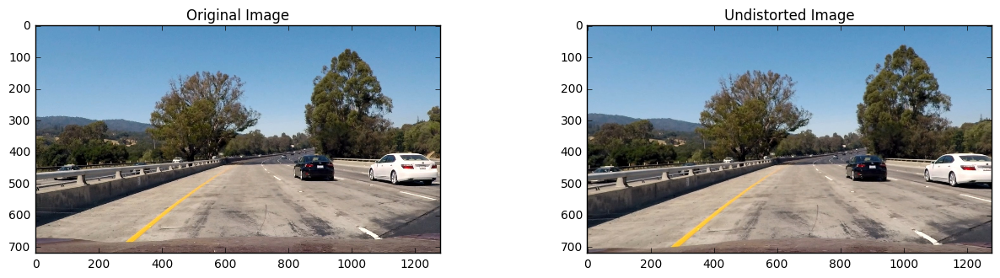

In [14]:
# load test images
PATH = "test_images/"
images = os.listdir("test_images")[1:]

# Undistort test images to validate camera matrix and distortion coefficients
img = cv2.imread(PATH + images[2])
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
undist = undistort_image(img, mtx, dist)

# Plot orginal and undistorted images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 3))
ax1.imshow(img)
ax1.set_title('Original Image')
ax2.imshow(undist)
ax2.set_title('Undistorted Image')
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

---
## Step 3: Color and Gradient Threshold
To reliably detect lane lines on roads a combination of color and gradient thresholds were used to generate generate a binary image. Five different tresholding methods were tested and combined to find the optimal binary image representaion. They are the following:

* `abs_sobel_tresh()`: Method applies the Sobel operation in the x or y direction and returns a binary image
* `mag thresh()`: Method finds the magnitude of the Sobel operation in th x and y direction and returns binary image
* `dir_thresh()`: Method finds the direction of gradient of the Sobel operation and returns a binary image
* `hls_tresh()`: Methods converts the image into HLS color splace and uses the S-channel (saturation) for thresholding and returns a binary image

In [11]:
def abs_sobel_thresh(image, orient='x', sobel_kernel=3, thresh=(0, 255)):
    """ Write pydoc """
    # Grayscale image
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Sobel - gradient in x or y
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel))

    # Scale to 8 bit representation 0-255
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))

    # Binary image mask
    binary_output =  np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    
    return binary_output
    
def mag_thresh(image, sobel_kernel=3, thresh=(0, 255)):
    """ Write pydoc """
    # Grayscale image
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Sobel- gradients in x and y
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)

    # Scale magnitude to 8 bit representation (0-255)
    sobel_mag = np.sqrt(sobel_x**2 + sobel_y**2)
    scaled_mag = np.uint8(255*sobel_mag/np.max(sobel_mag))

    # Binary image mask
    binary_output = np.zeros_like(scaled_mag)
    binary_output[(scaled_mag >= thresh[0]) & (scaled_mag <= thresh[1])] = 1

    return binary_output

def dir_thresh(image, sobel_kernel=3, thresh=(0, np.pi/2)):
    """ write pydoc """
    # Grayscale image
    gray = cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Sobel- gradients in x and y
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)

    # Direction of the gradient
    sobel_dir = np.arctan2(np.absolute(sobel_y), np.absolute(sobel_x))

    # Binary image mask
    binary_output = np.zeros_like(sobel_dir)
    binary_output[(sobel_dir >= thresh[0]) & (sobel_dir <= thresh[1])] = 1

    return binary_output

def hls_thresh(image, thresh= (0,255)):
    """ write pydoc """
    # Convert image to HLS color space
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]

    # Binary image mask
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    
    return binary_output 

def gradient_color_thresh(image):
    """pydoc"""
    # Threshold values (min, max)
    thresh_x = (20, 200)
    thresh_hls = (150, 255)
    
    # Apply Sobel gradient in the x-direction and color threshold 
    # on the S-channel of the HLS color space
    binary_x = abs_sobel_thresh(image, orient='x', sobel_kernel=5, thresh=thresh_x)
    binary_hls = hls_thresh(image, thresh=thresh_hls)
    
    # Combined binary output
    combined_binary = np.zeros_like(binary_x)
    combined_binary[(binary_hls==1) | (binary_x==1)] = 1

    return combined_binary

### Sobel: Gradient in the X Direction
After cycling through test images. Applying sobel in the X-direction was the most robust approach for extracting lane lines compared to obtaining the gradient in the y-direction and the mangnitude and direction of the gradient

In [6]:
img = cv2.imread(PATH + images[6])
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = undistort_image(img, mtx, dist)

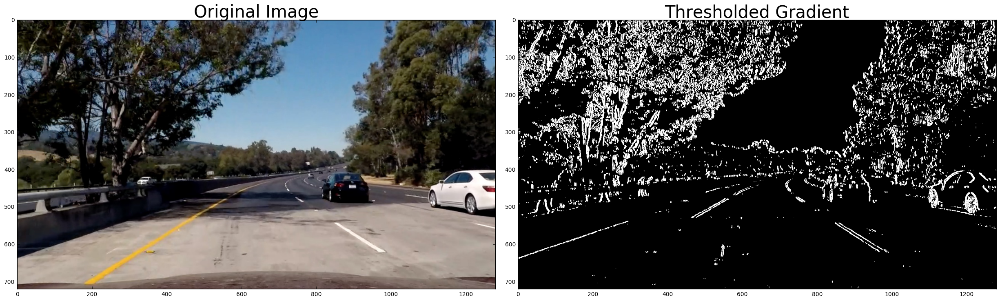

In [250]:
binary_x = abs_sobel_thresh(img, orient='x',sobel_kernel=5, thresh=(20,200))

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(binary_x, cmap='gray')
ax2.set_title('Thresholded Gradient', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Sobel: Gradient in the Y Direction

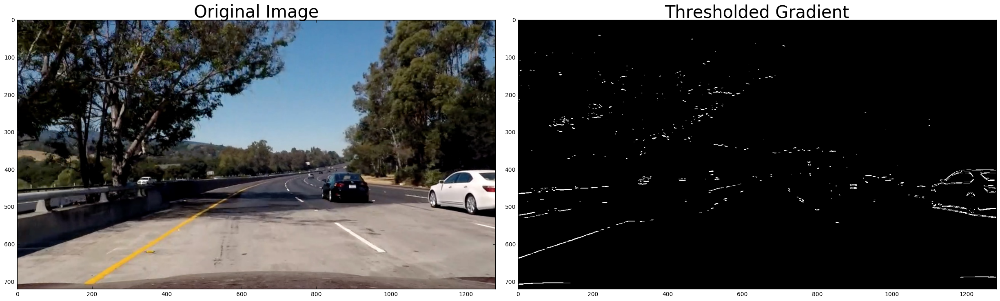

In [8]:
binary_y = abs_sobel_thresh(img, orient='y',sobel_kernel=9, thresh=(90,150))

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(binary_y, cmap='gray')
ax2.set_title('Thresholded Gradient', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Sobel: Gradient Magnitude

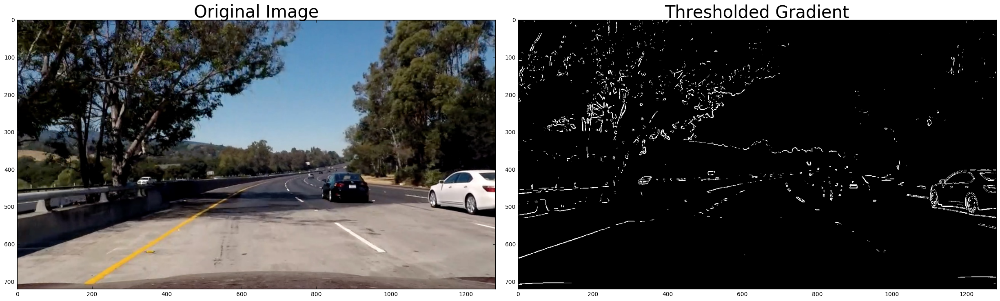

In [9]:
binary_mag = mag_thresh(img ,sobel_kernel=5, thresh=(80,150))

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(binary_mag, cmap='gray')
ax2.set_title('Thresholded Gradient', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### HLS: Color Threshold

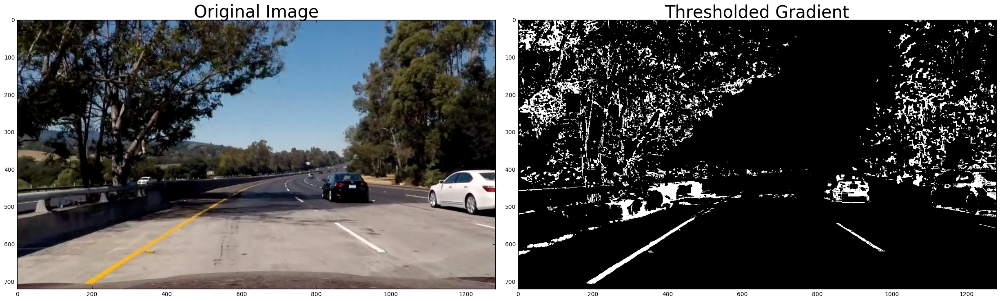

In [252]:
binary_hls = hls_thresh(img, thresh=(150, 255))

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(binary_hls, cmap='gray')
ax2.set_title('Thresholded Gradient', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Combine Color and Gradient Binaries

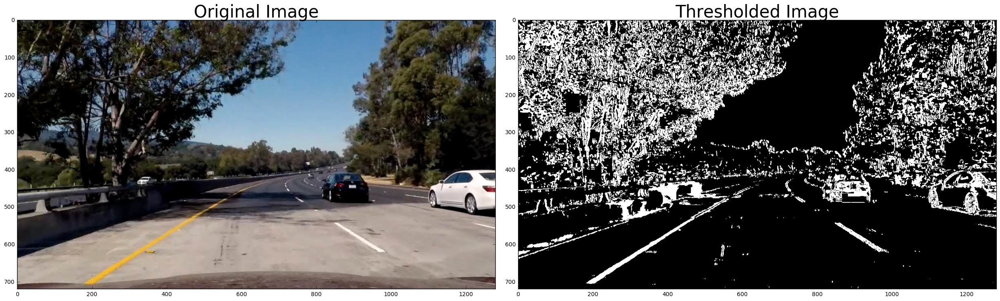

In [258]:
combined_binary = gradient_color_thresh(img)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(combined_binary, cmap='gray')
ax2.set_title('Thresholded Image', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

---
## Step 4: Perspective Transform

In order to compute the perspective transform, points of a given image have to be mapped to different points in the same image. The perspective transform of interest for the lane finding algorithm is the bird's-eye (top-down) view of the lane ahead. This is extremely useful to calculate the curvature of a given lane. The steps to compute the perspective transform to achieve a bird's-eye view are the following:

1. Determine source points, coordinates of the region of the image you want to transform
2. Determine destination points, coordinates of the region you want to map your source points to
3. Use the OpenCV function **`cv2.getPerspectiveTransform`** to get M, the transform matrix
4. Use the OpenCV function **`cv2.warpPerspective`**  to apply M and warp image to a top-down view

**Note**: An important assumption we make is that the road is flat

In [12]:
def perspective_transform(image, M):
    img_size = (image.shape[1], image.shape[0])
    warped_image = cv2.warpPerspective(image, M, img_size, flags=cv2.INTER_LINEAR)
    return warped_image

In [15]:
# Select image with a segment of straight road
straight_lines = cv2.imread(PATH + images[0])
straight_lines = cv2.cvtColor(straight_lines, cv2.COLOR_BGR2RGB)
straing_lines = undistort_image(straight_lines, mtx, dist)

# Image dimensions
height = straight_lines.shape[0]
width = straight_lines.shape[1]

# Source points: trapezoid verteces - (width, height)
src1 = (592, 450)         # top right
scr2 = (180, height)      # bottom left
src3 = (1130, height)     # bottom right
src4 = (687, 450)         # top left
src_points = np.array([[src1, scr2, src3, src4]]).astype('float32')

# Destination points: 800x720 rectangle - (width, height)
dst1 = (240, 0)           # top right
dst2 = (240, height)      # bottom left
dst3 = (1040, height)     # bottom right
dst4 = (1040, 0)          # top left 
dst_points = np.array([[dst1, dst2, dst3, dst4]]).astype('float32')

# Get perspective transform matrix and its inverse
M = cv2.getPerspectiveTransform(src_points, dst_points)
M_inv = cv2.getPerspectiveTransform(dst_points, src_points)

### Straight Line Test
To check if our perspective transform was done correctly, the destinaton points were drawn on the warped image and used as a guide to check if the lane markings are straight and parallel.

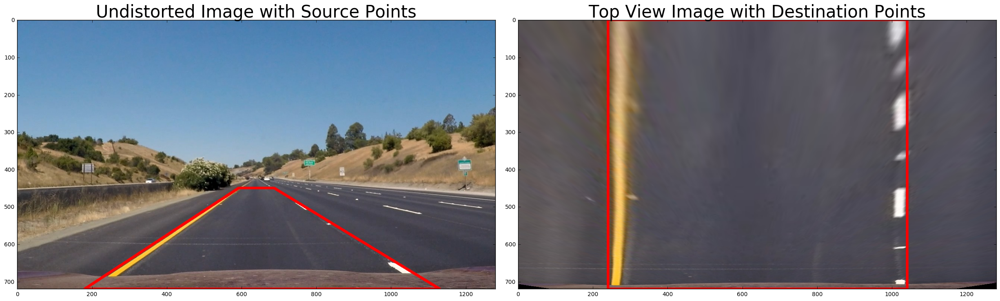

In [243]:
# Draw source points on original image
src_image = np.copy(straight_lines)
src_image = cv2.polylines(src_image, src_points.astype('int32'), 1, (255,0,0), thickness=6)

# Draw destination points on warped imape (bird's eye view)
warped_image = np.copy(straight_lines)
warped_image = perspective_transform(warped_image, M)
warped_image = cv2.polylines(warped_image, dst_points.astype('int32'), 1, (255,0,0), thickness=6)

# Plot visual
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(src_image)
ax1.set_title('Undistorted Image with Source Points', fontsize=30)
ax2.imshow(warped_image)
ax2.set_title('Top View Image with Destination Points', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Curved Line Test
Using the same source and destination point we can change the perspective. To test the efficacy of the perspective transform when dealing with curved lines lines should appear parallel.

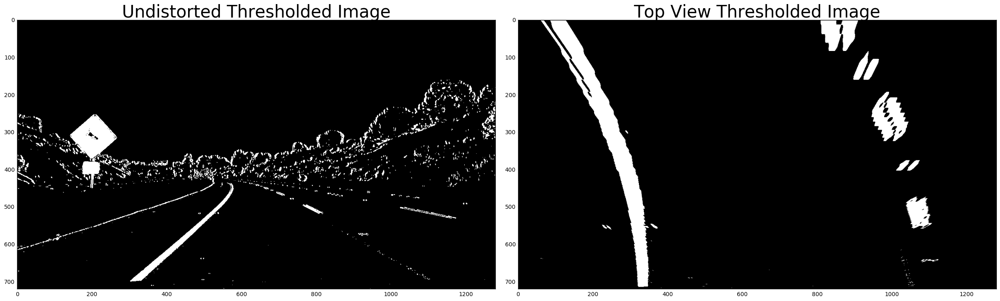

In [206]:
# Select test image with a segment of curved road
curved_lines = cv2.imread(PATH + images[3])
curved_lines = cv2.cvtColor(curved_lines, cv2.COLOR_BGR2RGB)
curved_lines = undistort_image(curved_lines, mtx, dist)

# Apply color and gradient threshold
thresh_image = gradient_color_thresh(curved_lines)

# Threshold original image
src_image_c = np.copy(thresh_image)

# Warp image (bird's eye view)
warped_image_c = np.copy(thresh_image)
warped_image_c = perspective_transform(warped_image_c, M)

# Plot visual
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(src_image_c, cmap='gray')
ax1.set_title('Undistorted Thresholded Image', fontsize=30)
ax2.imshow(warped_image_c, cmap='gray')
ax2.set_title('Top View Thresholded Image', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

As seen above, after applying the perspective transform the curved lines appear parallel

##### Process image pipeline
Quick method to accelerate testing in the development of the lane detection algorithm

In [16]:
def process_image_test(image, mtx, dst, M):
    # Undistort image
    processed_image = undistort_image(image, mtx, dst)
    # Apply color and gradient threshold
    processed_image = gradient_color_thresh(processed_image)
    # Apply bird's eye view perspective transform
    processed_image = perspective_transform(processed_image, M)
    
    return processed_image    

***
# Part 2: Detect Lane Lines

Once the color and gradient thresholds and the perspective transform have been applied we can utilize the resulting binary image and the sliding window method to locate position of the left and right lines that compose a lane. The sliding window method can be summerized in following steps:

1. Identify the initial location of each line by computing the histogram of the lower half of the binary image. The two peaks of the histogram correspond to the initial location of the left and right lines of the lane in the x-axis
2. Divide image into 10 horizontal slices
3. Draw a window centered at the initial location of the left and right line and store the x and y coordinates that are within the bounds of the window
4. Repeat Step 3 for each window this time recentering the window to the average of the x values of the pixels that are within the bounds of the window

---
## Step 1: Locate Lane Lines

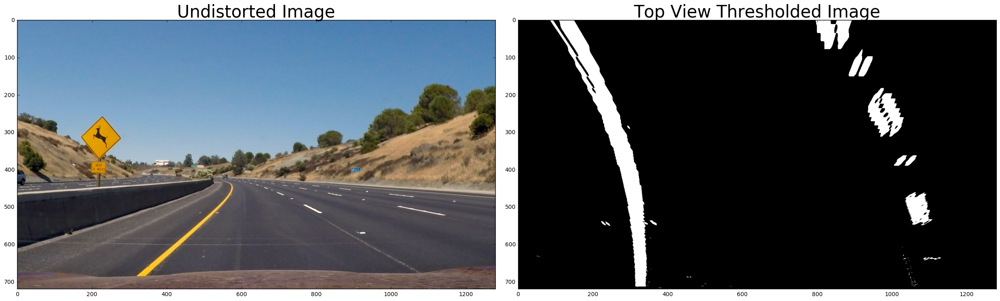

In [20]:
# Select test image to test locating lines
test_image = cv2.imread(PATH + images[3])
test_image = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)
pro_test_image = process_image_test(test_image, mtx, dist, M)

# Plot visual
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(test_image, cmap='gray')
ax1.set_title('Undistorted Image', fontsize=30)
ax2.imshow(pro_test_image, cmap='gray')
ax2.set_title('Top View Thresholded Image', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Sliding Window Lane detection
### Histogram
It is possible to locate the initial position of the lanes in the x-axis by adding all pixel values along the y-axis for the lower half of the image and then computing its histogram. In the histogram below two major peaks are visible. The location of these two peaks represent the location of the 2 lines that compose a lane.

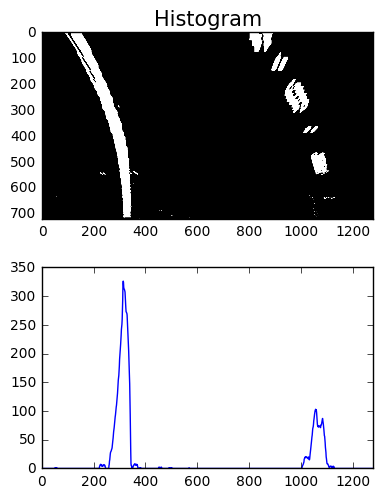

In [21]:
height = pro_test_image.shape[0]
width = pro_test_image.shape[1]

# Compute histogram
histogram = np.sum(pro_test_image[int(height/2):,:], axis=0)

# Plot visual
f, (ax1, ax2) = plt.subplots(2, 1, figsize=(4, 5))
f.tight_layout()
ax1.imshow(pro_test_image, cmap='gray')
ax1.set_title('Histogram', fontsize=15)
ax2.set_xlim([0, width])
ax2.plot(histogram)

### Sliding Window Lane Detection Continued

In [17]:
def sliding_window_lane_detection(warped_image, n_windows=10, margin=100, min_pixels=50):
    # Image dimensions
    height = warped_image.shape[0]
    width = warped_image.shape[1]
    
    #  Prepare and image to draw on for debuggin purposes
    # out_img = np.dstack((warped_image, warped_image, warped_image))*255
    
    # Compute histogram of the bottom portion of the image
    histogram = np.sum(warped_image[int(height/2):, :], axis=0)
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = int(width/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    # Determine window height
    window_height = int(height/n_windows) 
    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = warped_image.nonzero()
    nonzero_y = nonzero[0]
    nonzero_x = nonzero[1]

    # Receive left and right lines indeces
    left_lane_inds = []
    right_lane_inds = []
    
    # current position of the right and left lines in the x-axis
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    # Analyze each window from bottom to top
    for window in range(n_windows):
        # Identify window height boundaries
        win_y_low = height - (window + 1) * window_height      
        win_y_high = height - window * window_height       
        
        # Identify window width boundaries for the left line and right lanes
        win_xleft_low = leftx_current - margin       
        win_xleft_high =  leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw windows for debugging purposes
        # cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        # cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2)
        
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzero_y >= win_y_low)
                          & (nonzero_y < win_y_high) 
                          & (nonzero_x >= win_xleft_low) 
                          & (nonzero_x < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzero_y >= win_y_low)
                          & (nonzero_y < win_y_high) 
                          & (nonzero_x >= win_xright_low) 
                          & (nonzero_x < win_xright_high)).nonzero()[0]
        
        # Append pixel indeces that belong to the left and right lines
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If number of pixels > min_pixels, recenter next the window on their mean position
        if len(good_left_inds) > min_pixels:
            leftx_current = np.mean(nonzero_x[good_left_inds]).astype('int')
        if len(good_right_inds) > min_pixels:
            rightx_current = np.mean(nonzero_x[good_right_inds]).astype('int')
        
    # Concatanate arrays of indeces collected
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    
    # Extract x and y coordinates for left and right line pixel positions
    left_x = nonzero_x[left_lane_inds]
    left_y = nonzero_y[left_lane_inds]
    right_x = nonzero_x[right_lane_inds]
    right_y = nonzero_y[right_lane_inds]
   
    ############# DEBUGING #################
    """ 
    # Fit a second order polynomial for each line
    left_fit = np.polyfit(left_y, left_x, 2)
    right_fit = np.polyfit(right_y, right_x, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, warped_image.shape[0]-1, warped_image.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    out_img[nonzero_y[left_lane_inds], nonzero_x[left_lane_inds]] = [255, 0, 0]
    out_img[nonzero_y[right_lane_inds], nonzero_x[right_lane_inds]] = [0, 0, 255]
    plt.imshow(out_img)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    """
    return left_x, left_y, right_x, right_y

Below is an example of how a frame is processed after the perspective transfrom is applied using the sliding window method above. After detecting all the relevant pixels in each line these can be  used to fit a second order polynomial for each line as seen in yellow in the picture below.

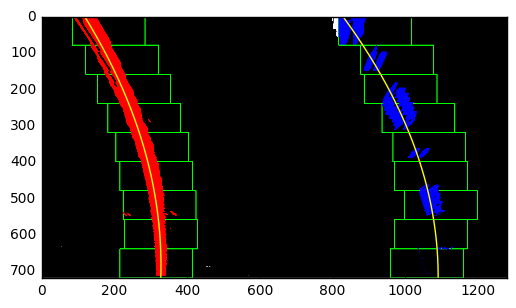

In [166]:
sliding_window_lane_detection(pro_test_image)

### More Lane Finding
It is not always necessary to search for the exact location of the lane lines for each image frame. We can utilize the  previous detection as a reference to search for lines in the subsequent frame. If the lines are not reliably detected then the lanes are searched from scratch using th sliding window method

In [18]:
def local_search_lane_finding(warped_image, left_fit, right_fit):
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = warped_image.nonzero()
    nonzero_y = np.array(nonzero[0])
    nonzero_x = np.array(nonzero[1])
   
    # Set margin +/1 margin to identify pixels near the current lane fit
    margin = 100
    
    # Identify pixels within the margin of the current second order fit
    left_lane_inds = ((nonzero_x > (np.polyval(left_fit, nonzero_y) - margin)) 
                      & (nonzero_x < (np.polyval(left_fit, nonzero_y) + margin))) 
    right_lane_inds = ((nonzero_x > (np.polyval(right_fit, nonzero_y) - margin)) 
                      & (nonzero_x < (np.polyval(right_fit, nonzero_y) + margin)))  

    # Extract left and right line pixel positions
    left_x = nonzero_x[left_lane_inds]
    left_y = nonzero_y[left_lane_inds] 
    right_x = nonzero_x[right_lane_inds]
    right_y = nonzero_y[right_lane_inds]
    

    ############# DEBUGING #################
    """
    # Fit a second order polynomial for each line
    left_fit = np.polyfit(left_y, left_x, 2)
    right_fit = np.polyfit(right_y, right_x, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, warped_image.shape[0]-1, warped_image.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((warped_image, warped_image, warped_image))*255
    window_img = np.zeros_like(out_img)
    
    # Color in left and right line pixels
    out_img[nonzero_y[left_lane_inds], nonzero_x[left_lane_inds]] = [255, 0, 0]
    out_img[nonzero_y[right_lane_inds], nonzero_x[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    plt.imshow(result)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    
    print("left line coeffs: ", left_fit)
    print("right line coeffs: ", right_fit)
    """
    return left_x, left_y, right_x, right_y

##### Test detection

left line coeffs:  [  2.36815312e-04  -3.55617053e-01   4.38701756e+02]
right line coeffs:  [  4.07050490e-04  -5.16798176e-01   1.26038267e+03]


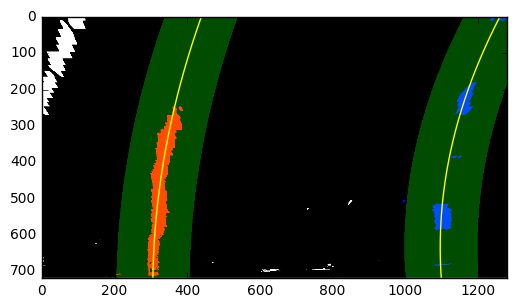

In [28]:
# Select test image to test locating lines with sliding window
test_image_A = cv2.imread(PATH + images[4])
test_image_A = cv2.cvtColor(test_image_A, cv2.COLOR_BGR2RGB)
pro_test_image_A = process_image_test(test_image_A, mtx, dist, M)
left_x, left_y, right_x, right_y = sliding_window_lane_detection(pro_test_image_A)
left_fit, right_fit = fit_curves(left_x, left_y, right_x, right_y)

# Select following frame to test local search
test_image_B = cv2.imread(PATH + images[5])
test_image_B = cv2.cvtColor(test_image_B, cv2.COLOR_BGR2RGB)
pro_test_image_B = process_image_test(test_image_B, mtx, dist, M)
left_x, left_y, right_x, right_y = local_search_lane_finding(pro_test_image_B, left_fit, right_fit)

---
## Step 2: Fit curve
After collecting the x and y coordinates of the pixels that belong to each lane line, a second degree polynomial was fitted to each. It is important to note that the polynomials was fitted as a fuction of y since it's the axis that best describes the change in curvature along the length of the lane.

In [19]:
def fit_curves(left_x, left_y, right_x, right_y):
    # Fit second order polynomial
    left_fit = np.polyfit(left_y, left_x, 2)
    right_fit =  np.polyfit(right_y, right_x, 2)
    return left_fit, right_fit

def generate_plotting_values(left_fit, right_fit, image_size):
    # Generate y values for plotting
    ploty = np.linspace(0, image_size[0]-1, image_size[0])
    
    # Evaluate x values for plotting
    left_fitx =  np.polyval(left_fit, ploty)
    right_fitx = np.polyval(right_fit, ploty)
    
    return ploty, left_fitx, right_fitx

---
## Step 4: Calculate Radius of Curvature and Camera Offset 

### Radius of Curvature
The image belows shows how the radius of curvature equation was derived.

<img src="readme_images/formula.png">

In [20]:
def get_curvature_radius(left_fit, right_fit, image_size):
    # Convert pixel space to real world space in meters under the assumption
    # that a lane spans 30 meters and it's 3.7 meters wide
    ym_per_pix = 30/720    # meters per pixel in y dimension
    xm_per_pix = 3.7/700   # meters per pixled in x dimension
    
    # Generate  and x, y plotting points along the height of the entire frame
    plot_y = np.linspace(0, 719, num=720)
    left_fitx = np.polyval(left_fit, plot_y)
    right_fitx = np.polyval(right_fit, plot_y)
    
    # Fit new polynomial in real world space (meters)
    left_fit_m = np.polyfit(plot_y*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_m = np.polyfit(plot_y*ym_per_pix, right_fitx*xm_per_pix, 2)
    
    # Closes point to the front of the car will be current 
    # response of the car for the lane curvature
    y_eval = image_size[0]
    
    # Calculate the new radii of curvature
    left_curve_rad = ((1 + (2*left_fit_m[0]*y_eval*ym_per_pix + left_fit_m[1])**2)**1.5) / np.absolute(2*left_fit_m[0])
    right_curve_rad = ((1 + (2*right_fit_m[0]*y_eval*ym_per_pix + right_fit_m[1])**2)**1.5) / np.absolute(2*right_fit_m[0])
    lane_curvature = np.mean([left_curve_rad, right_curve_rad])
    return lane_curvature

##### Test Measurement

In [169]:
lane_curvature = get_curvature_radius(left_fit, right_fit, pro_test_image_B.shape)
print(lane_curvature, 'm')

528.711306136 m


### Camera Center Location Offset
To compute the offset of the car from the center of the lane, the left and right lines' polynomial fits were used to evaluate the postion of the line at the bottom of each frame (the position closest to the car). Under the assumption that a lane is 3.7 meters wide, according to the US Department of Transportation, the distance between the left and right line was scaled to a real-world value. To find the offset, the difference between the center of the image and the center of the lane was computed.

In [21]:
def get_camera_offset(left_fit, right_fit, image_size):
    lane_width = 3.7    # meters
    height = image_size[0]  
    width = image_size[1]
    
    # Obtain the x position of each line
    # at the bottom of each frame
    left_x = np.polyval(left_fit, height)
    right_x = np.polyval(right_fit, height)
    
    # Obtain camera location: center of the frame
    midpoint = width/2
    
    # Scale lane width to meters
    diff = np.absolute(right_x - left_x)
    scale = lane_width/diff
    offset = (midpoint -np.mean([left_x, right_x]))*scale

    return offset

##### Test measurement

In [32]:
# test offset measurement
left_fit, right_fit = fit_curves(left_x, left_y, right_x, right_y)
print(get_camera_offset(left_fit, right_fit, pro_test_image_B.shape), "m")

-0.290651023648 m


---
## Step 4: Drawing Detected lane Back on the Road 
We have obtained measurements of the line position in warped space. To visualize the detection we will project the detection back on the road using the plotting points obatined from the line fits: `left_fitx`, `right_fitx` and `ploty`

In [22]:
def project_lane(image, left_fit, right_fit, M_inv):
    # Create new image to draw lines on
    warped_zero = np.zeros_like(image[:,:,0]).astype('uint8')
    color_warped = np.dstack((warped_zero, warped_zero, warped_zero))
    
    # Evaluate plotting points
    plot_y, left_fitx, right_fitx = generate_plotting_values(left_fit, right_fit, image.shape)

    # Create a polygon to represent the detected lane
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, plot_y]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, plot_y])))])
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warped, np.int_([pts]), (0,255, 0))
    
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    new_warped = cv2.warpPerspective(color_warped, M_inv, (image.shape[1], image.shape[0])) 
    
    # Combine the result with the original image
    result = cv2.addWeighted(image, 1, new_warped, 0.3, 0)
   
    return result

##### Test Lane Projection

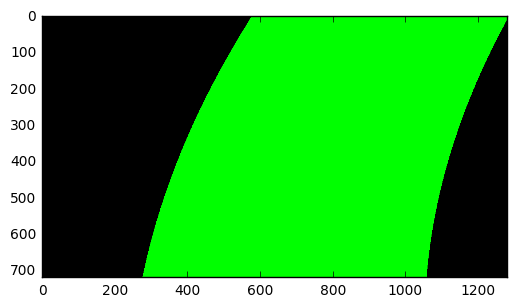

In [88]:
# Load test image
test_image_C = cv2.imread(PATH + images[4])
test_image_C = cv2.cvtColor(test_image_C, cv2.COLOR_BGR2RGB)

# Process image - undistort, threshold, transform perspective
pro_test_image_C = process_image_test(test_image_C, mtx, dist, M)

# Detect x and y coordinates for the lane
left_x, left_y, right_x, right_y = sliding_window_lane_detection(pro_test_image_C)

# Fit detected left and right x and y coordinates
left_fit, right_fit = fit_curves(left_x, left_y, right_x, right_y)

# Project lane onto the original image
final_test_image_C = project_lane(undistort_image(test_image_C, mtx, dist), left_fit, right_fit, M_inv)

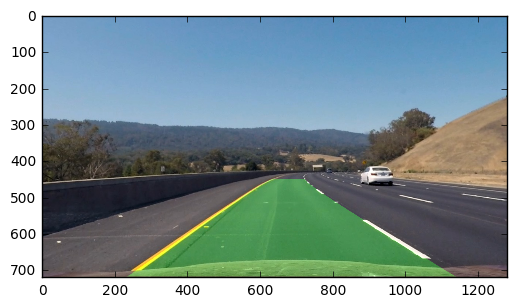

In [86]:
plt.imshow(final_test_image_C)

---
# Part 3: The Pipeline - Putting it All Together

The diagram below summarizes the pipeline flow to process image frames.

<img src="readme_images/flow_chart.png">

The class lane was made as a container to hold relevant information of the currently detected lane. It can be expanded to support a more robust lane detection pipeline.


In [23]:
class Lane():
    def __init__(self):
        # weighted polynomial coeffecients for the left line
        self._left_fit = None 
        # weighted polynomial coefficients for the right line
        self._right_fit = None  
        #radius of curvature of the line in some units
        self._radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self._lane_offset = None 
     
    @property
    def right_fit(self):
        return self._right_fit
    
    @property
    def left_fit(self):
        return self._left_fit
    
    @property
    def radius_of_curvature(self):
        return self._radius_of_curvature
    
    @property
    def lane_offset(self):
        return self._lane_offset
    
    @right_fit.setter
    def right_fit(self, value):
        self._right_fit = value
   
    @left_fit.setter
    def left_fit(self, value):
        self._left_fit = value 
    
    @radius_of_curvature.setter
    def radius_of_curvature(self, value):
        self._radius_of_curvature = value
    
    @lane_offset.setter
    def lane_offset(self, value):
        self._lane_offset = value


#### Distortion Correction coeffecients and Perspective Transform Matrices
These are computed once and fed into the `process_frame()` function.

In [24]:
# ============================================== 
#  Load Camera Distortion Correction Parameters
# ==============================================  
with open('dist_pickle.p', 'rb') as f:
    dist_params = pickle.load(f)
    mtx = dist_params['mtx']
    dist = dist_params['dist']

# ============================================== 
#  Compute Perspective Transform Matrices
# ==============================================  
    
# Image dimensions
height, width = 720, 1280

# Source points: trapezoid verteces - (width, height)
src1 = (592, 450)         # top right
scr2 = (180, height)      # bottom left
src3 = (1130, height)     # bottom right
src4 = (687, 450)         # top left
src_points = np.array([[src1, scr2, src3, src4]]).astype('float32')

# Destination points: 800x720 rectangle - (width, height)
dst1 = (240, 0)           # top right
dst2 = (240, height)      # bottom left
dst3 = (1040, height)     # bottom right
dst4 = (1040, 0)          # top left 
dst_points = np.array([[dst1, dst2, dst3, dst4]]).astype('float32')

# Get perspective transform matrix and its inverse
M = cv2.getPerspectiveTransform(src_points, dst_points)
M_inv = cv2.getPerspectiveTransform(dst_points, src_points)

#### Process Frame Pipeline

In [46]:
def process_frame(image, lane, mtx, dist, M, M_inv):
    # Alpha values for first order filters for smoothing
    curv_alpha = 0.05
    fit_alpha = 0.2

    undist_image = undistort_image(image, mtx, dist)
    
    # Apply color and gradient threshold
    processed_image = gradient_color_thresh(undist_image)
    
    # Apply bird's eye view perspective transform
    processed_image = perspective_transform(processed_image, M)
    
    # Detect x and y coordinates for the lane
    left_x, left_y, right_x, right_y = sliding_window_lane_detection(processed_image)

    # Fit detected left and right x and y coordinates
    left_fit, right_fit = fit_curves(left_x, left_y, right_x, right_y)
    
    # Update left and right line fits
    if lane.left_fit is None:
        lane.left_fit = left_fit
        lane.right_fit = right_fit
    else:
        lane.left_fit = (1 - fit_alpha) * lane.left_fit + fit_alpha * left_fit
        lane.right_fit = (1 - fit_alpha) * lane.right_fit + fit_alpha * right_fit
 
    # Calculate Lane Curvature and Camera Lane Center Offset
    lane_curvature = get_curvature_radius(lane.left_fit, lane.right_fit, image.shape)
    lane.lane_offset = get_camera_offset(lane.left_fit, lane.right_fit, image.shape)
    
    # Update lane curvature
    if lane.radius_of_curvature is None:
        lane.radius_of_curvature = lane_curvature
    else:
        lane.radius_of_curvature = ((1 - curv_alpha) * lane.radius_of_curvature 
        + curv_alpha * lane_curvature)
        
    # Project lane onto the original image
    result = project_lane(undist_image, lane.left_fit, lane.right_fit, M_inv)
    
    # Put calculated values on the top of each frame
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(result, 'Lane Curvature: {:.2f} m'.format(lane.radius_of_curvature), 
                (int(image.shape[0]/2), 100), font, 1.5, (255,255,255), 5)
    cv2.putText(result, 'Lane Center Offset: {:.2f} m'.format(lane.lane_offset), 
                (int(image.shape[0]/2), 150), font, 1.5,(255,255,255), 5)
    
    return result

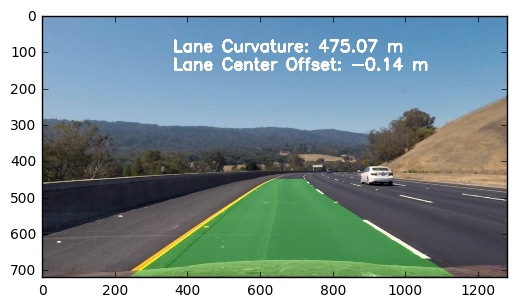

In [42]:
# Load test image
test = cv2.imread(PATH + images[4])
test = cv2.cvtColor(test, cv2.COLOR_BGR2RGB)
test = process_frame(test, mtx, dist, M, M_inv)
plt.imshow(test)

In [32]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

## Process Video

In [47]:
lane = Lane()
output = 'result.mp4'
clip1 = VideoFileClip("project_video.mp4")
process_video = lambda process_frame:process_frame()
project_clip = clip1.fl_image(lambda frame: process_frame(frame, lane, mtx, dist, M, M_inv))
test_clip = project_clip
%time test_clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video result.mp4
[MoviePy] Writing video result.mp4


100%|█████████▉| 1260/1261 [02:54<00:00,  7.87it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: result.mp4 

CPU times: user 3min 14s, sys: 29.4 s, total: 3min 43s
Wall time: 2min 55s
